In [26]:
from fastai.tabular.all import *

# Load the csv
df = pd.read_csv('./date_hood_thefts_filled.csv',
                 names=["date", "hood_id", "thefts"])
df.head()


,date,hood_id,thefts
0,2015-01-01,0,0
1,2015-01-01,1,0
2,2015-01-01,2,0
3,2015-01-01,3,0
4,2015-01-01,4,0


In [27]:
# Drop hood_id and group by date and sum thefts
df = df.drop(columns=['hood_id'])
df = df.groupby('date').sum()
df.head()

,thefts
date,
2015-01-01,0
2015-01-02,31
2015-01-03,17
2015-01-04,23
2015-01-05,22


<AxesSubplot: xlabel='date'>

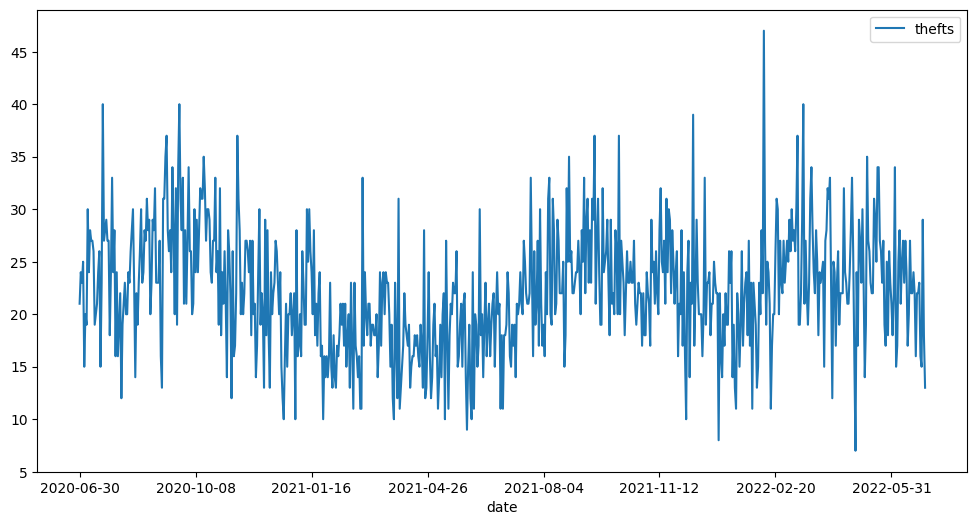

In [28]:
# Plot thefts by the last 2 years
df[-730:].plot(figsize=(12, 6))


In [29]:
# Get the last date in the dataset
from datetime import datetime


last_date = df.index[-1]
# Convert the last date to a datetime object

last_date = datetime.strptime(last_date, '%Y-%m-%d')
last_date

datetime.datetime(2022, 6, 29, 0, 0)

In [30]:
from datetime import timedelta

# Create a dataframe for predictions
df_predictions = pd.DataFrame()

# Loop through the next 365 days starting from the last date
for i in range(1, 366):
  # Create a new date
  new_date = last_date + timedelta(days=i)
  # Loop from 0 to 158
  for hood_id in range(0, 159):
    # Add the new date and hood_id to the dataframe
    df_predictions = df_predictions.append({'date': new_date, 'hood_id': hood_id}, ignore_index=True)

df_predictions.head()

/var/folders/7b/0z013d0x38n5dm8l78sg1z_m0000gn/T/ipykernel_74130/7299331.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_predictions = df_predictions.append({'date': new_date, 'hood_id': hood_id}, ignore_index=True)
/var/folders/7b/0z013d0x38n5dm8l78sg1z_m0000gn/T/ipykernel_74130/7299331.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_predictions = df_predictions.append({'date': new_date, 'hood_id': hood_id}, ignore_index=True)
/var/folders/7b/0z013d0x38n5dm8l78sg1z_m0000gn/T/ipykernel_74130/7299331.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_predictions = df_predictions.append({'date': new_date, 'hood_id': hood_id}, ignore_index=True)
/var/folders/7b/0z013d0x38n5dm8l78sg1z_m0000gn/T/ipykernel_74

,date,hood_id
0,2022-06-30,0
1,2022-06-30,1
2,2022-06-30,2
3,2022-06-30,3
4,2022-06-30,4


In [31]:
# Transform the date column to a datetime object
make_date(df_predictions, 'date')
df_predictions.head()


,date,hood_id
0,2022-06-30,0
1,2022-06-30,1
2,2022-06-30,2
3,2022-06-30,3
4,2022-06-30,4


In [32]:
# Feature engineer the date column
add_datepart(df_predictions, 'date')
df_predictions.head()


,hood_id,Year,Month,Week,Day,Dayofweek,Dayofyear,Is_month_end,Is_month_start,Is_quarter_end,Is_quarter_start,Is_year_end,Is_year_start,Elapsed
0,0,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09
1,1,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09
2,2,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09
3,3,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09
4,4,2022,6,26,30,3,181,True,False,True,False,False,False,1.656547e+09


In [ ]:
# Load the exported model
learn = load_learner('./exported_models/74_fill_imbalance.pkl')

In [25]:
# Get the predictions
row, clas, probs = learn.predict(df_predictions.iloc[10])


/Users/pika/.pyenv/versions/3.9.13/lib/python3.9/site-packages/fastai/tabular/core.py:279: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  to.conts = (to.conts-self.means) / self.stds


In [24]:
row.show()


/Users/pika/.pyenv/versions/3.9.13/lib/python3.9/site-packages/fastai/tabular/core.py:284: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  to.conts = (to.conts*self.stds ) + self.means


,hood_id,Year,Month,Week,Day,Dayofweek,Dayofyear,Is_month_end,Is_month_start,Is_quarter_end,Is_quarter_start,Is_year_end,Is_year_start,thefts
0,10,#na#,6,26,30,3,181,True,False,True,False,False,False,0
